<a href="https://colab.research.google.com/github/Maryamelias/DATA-4380.Maryam/blob/main/Wk4_HW3_Image_Preprocessing_Maryam.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [64]:
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image
import os
%matplotlib inline

In [65]:
!pwd

/content


In [66]:
os.getcwd()

'/content'

In [67]:
!ls

Panda.png  sample_data


# **Q1-Loading and Displaying Image (Numpy and OpenCV Basics):**

In [68]:
pic = Image.open("Panda.png")

In [69]:
###Using numpy
pic_array = np.asarray(pic)
pic_array.shape

(1528, 1522, 4)

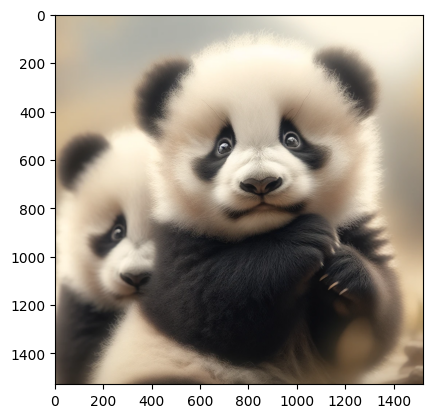

In [70]:
plt.imshow(pic_array)

In [71]:
## Color channels
pic_p = pic_array.copy()

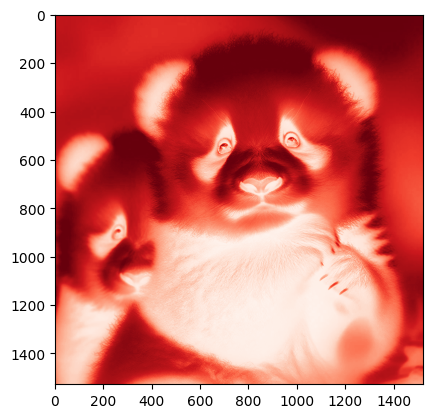

In [72]:
plt.imshow(pic_p[:, :, 0], cmap="Reds")  ##Red channel

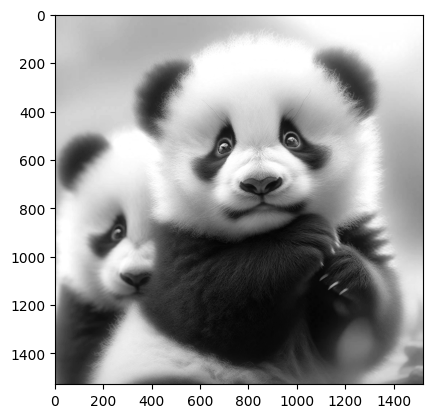

In [73]:
plt.imshow(pic_p[:, :, 0], cmap="gray")  ## gray channel

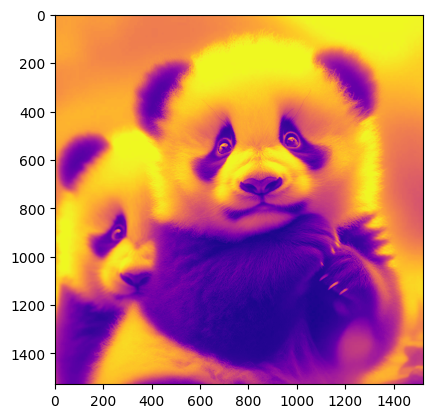

In [74]:
plt.imshow(pic_p[:, :, 0], cmap="plasma")  ##plasma channel

In [75]:
### Using OpenCV
import cv2
from google.colab.patches import cv2_imshow

In [76]:
### Load image
img = cv2.imread("Panda.png")

In [77]:
img.shape

(1528, 1522, 3)

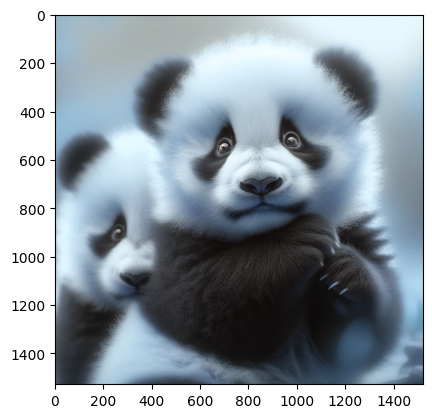

In [78]:
 plt.imshow(img)

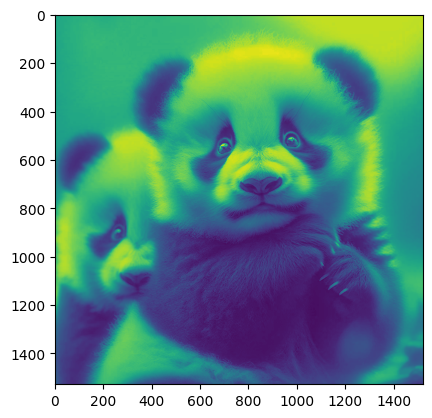

In [79]:
plt.imshow(pic_p[:, :, 2])  ##Gray channel

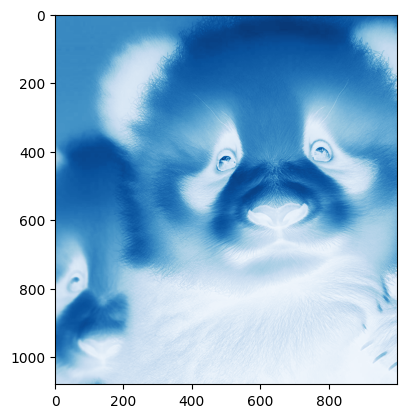

In [80]:
plt.imshow(pic_p[120:1200, 200:1200, 2], cmap="Blues")  ## channel

# **Q2-Color Space Conversion:**

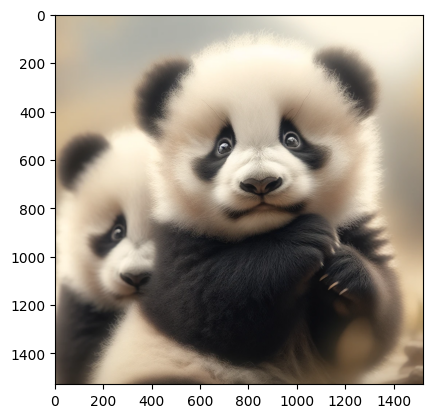

In [81]:
converted_img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
plt.imshow(converted_img)

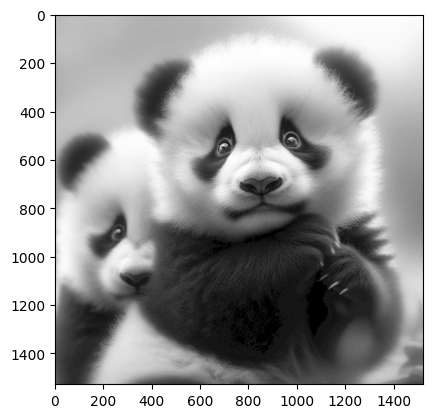

In [82]:
### Coverting to greyscale
img_gray= cv2.imread("Panda.png", cv2.IMREAD_GRAYSCALE)
plt.imshow(img_gray, cmap='gray')

# **Q3-Image Resizing:**

In [83]:
### Resizing the panda.png
converted_img.shape

(1528, 1522, 3)

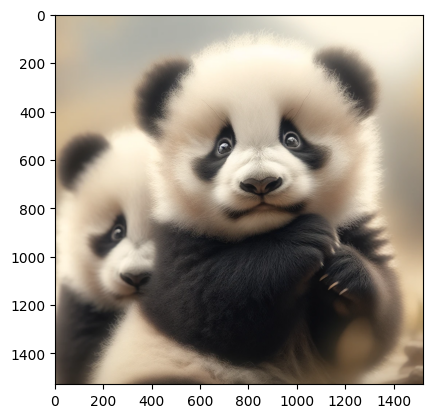

In [84]:
plt.imshow(converted_img)

In [85]:
resized_img = cv2.resize(converted_img, (1500, 1000))
resized_img.shape

(1000, 1500, 3)

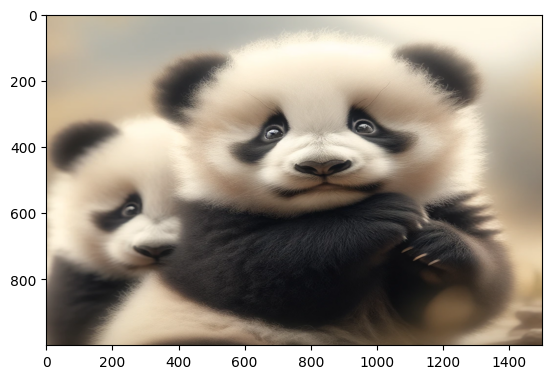

In [86]:
plt.imshow(resized_img)

In [87]:
## Image Resizing script
scale= 0.5
new_height=int(converted_img.shape[0]*scale)
new_width=int(converted_img.shape[1]*scale)

pic_resized = cv2.resize(converted_img, (new_width, new_height))
pic_resized.shape

(764, 761, 3)

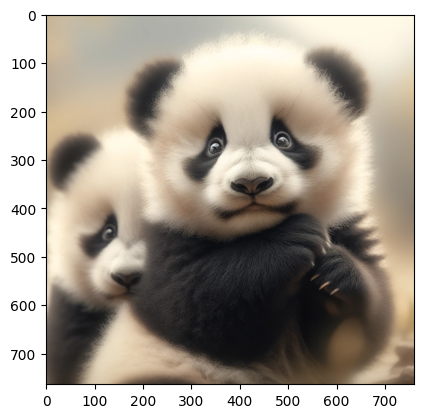

In [88]:
plt.imshow(pic_resized)

# **Q4-Image Thresholding:**

In [89]:
img_gray= cv2.imread("Panda.png", cv2.IMREAD_GRAYSCALE)

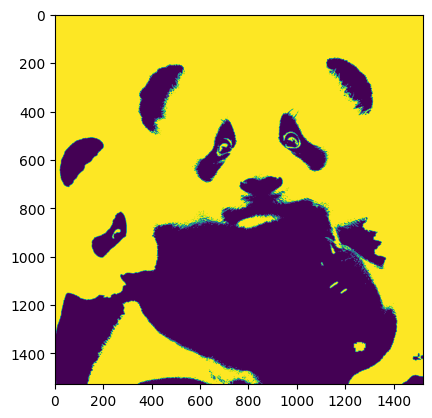

In [90]:
### Binary thresholding on the grayscale version
thresh_img = cv2.threshold(img_gray,100,100, cv2.THRESH_BINARY)[1]
plt.imshow(thresh_img)

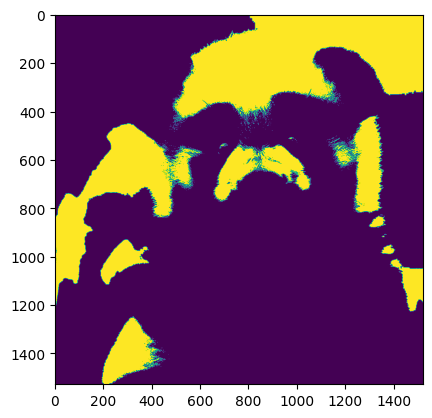

In [91]:
### Experimenting with threshold values
exp_thresh_img = cv2.threshold(img_gray,200,1000, cv2.THRESH_BINARY)[1]
plt.imshow(exp_thresh_img)

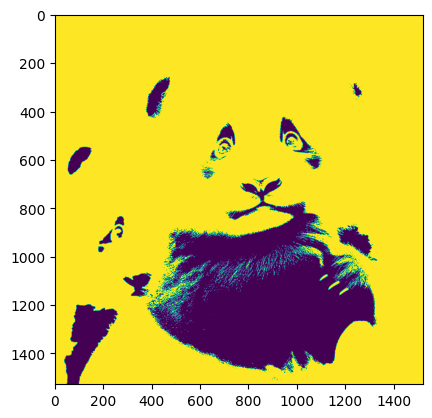

In [92]:
### Experimenting with threshold values
exp_thresh_img = cv2.threshold(img_gray,50,500, cv2.THRESH_BINARY)[1]
plt.imshow(exp_thresh_img)

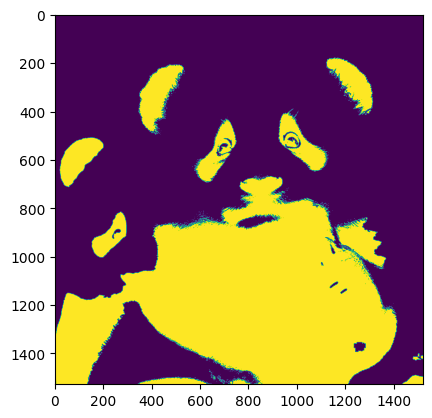

In [93]:
### Experimenting with threshold values
exp_thresh_img = cv2.threshold(img_gray,100,9, cv2.THRESH_BINARY_INV)[1]
plt.imshow(exp_thresh_img)

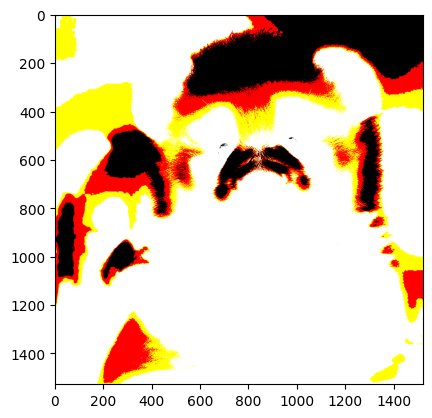

In [94]:
### Experimenting with threshold values
exp_thresh_img = cv2.threshold(img,200,500, cv2.THRESH_BINARY_INV)[1]
plt.imshow(exp_thresh_img)

# **Q5-Brightness Adjustment:**

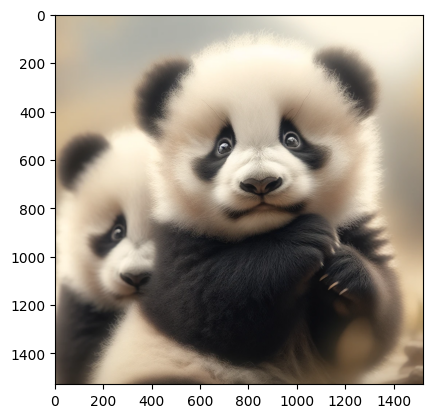

In [95]:
plt.imshow(converted_img)

In [96]:
## Brightness adjustment script

### Converting it to a hsv format to make brightness easier to adjust
hsv = cv2.cvtColor(converted_img, cv2.COLOR_BGR2HSV)

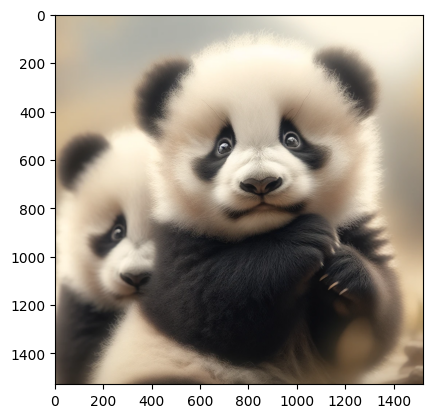

In [97]:
# Defining a brightness scale factor
brightness_scale = 1.5

# Scaling  the Value component to adjust brightness
hsv[:,:,2] = np.clip(hsv[:,:,2] * brightness_scale, 0, 255).astype(np.uint8)

# Converting HSV back to BGR
brightened_image = cv2.cvtColor(hsv, cv2.COLOR_HSV2BGR)

# Display the original img
plt.imshow(converted_img)

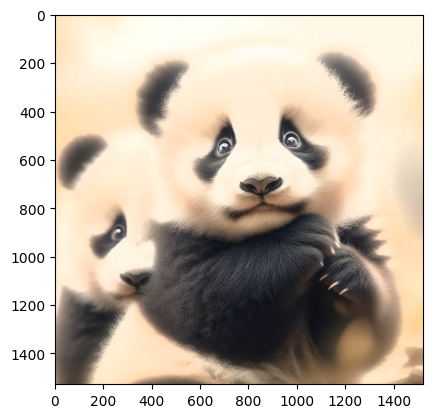

In [98]:
### Displaying brightened image
plt.imshow(brightened_image)

# **Q6-Blurring and Smoothing:**

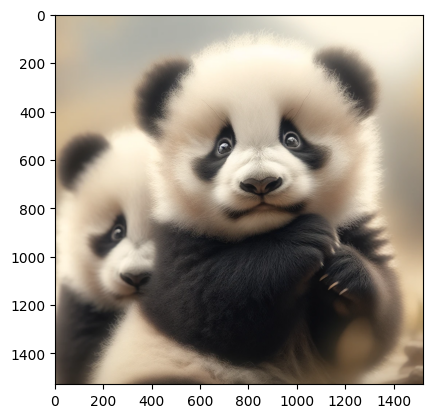

In [99]:
### Applying Gaussian blur to the image
blurred_img = cv2.GaussianBlur(converted_img, (33,33),100)
plt.imshow(converted_img)

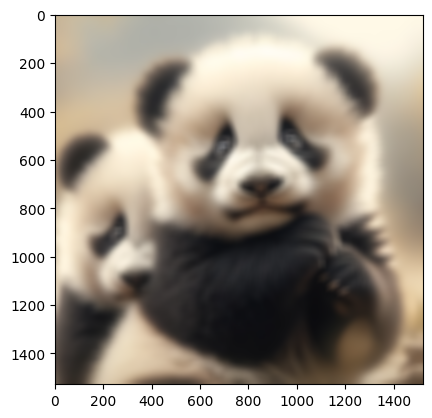

In [100]:
plt.imshow(blurred_img)

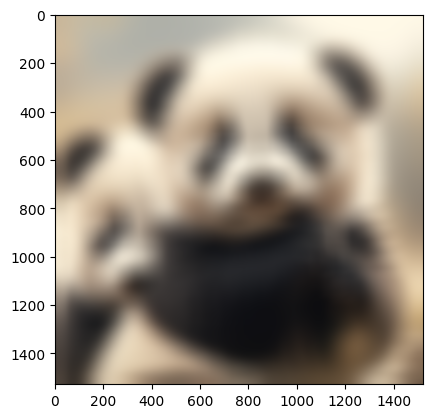

In [101]:
## Trying different kernel size, size= (105,105)
blurred_img = cv2.GaussianBlur(converted_img, (105, 105),100)
plt.imshow(blurred_img)

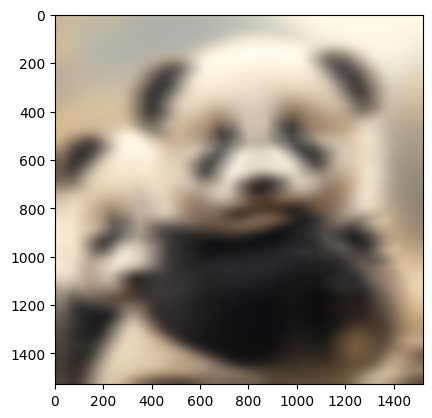

In [102]:
# Kernel size --> (113, 55)
blurred_img = cv2.GaussianBlur(converted_img, (113, 53),100)
plt.imshow(blurred_img)
plt.show()

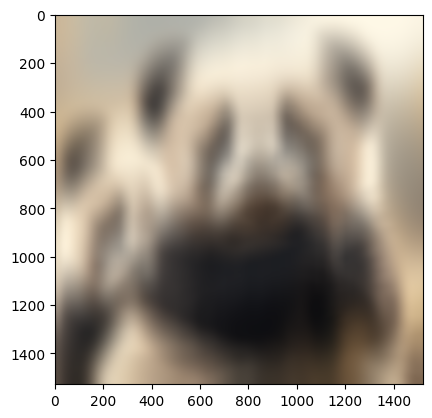

In [103]:
## Kernel size --> (55, 255)
blurred_img = cv2.GaussianBlur(converted_img, (55, 255),200)
plt.imshow(blurred_img)
plt.show()

It looks like the bigger the kernel size the higher the intensity of the blur, the intensity of the blur also increases with the values of the standard deviation. When the width is the bigger number the blur looks shaky to the side, and if the bigger number to the blur look shaky upward and downward.

# **Q7-Image Indexing and Cropping:**

In [104]:
### Cropping the portion the img using indexing
converted_img.shape

(1528, 1522, 3)

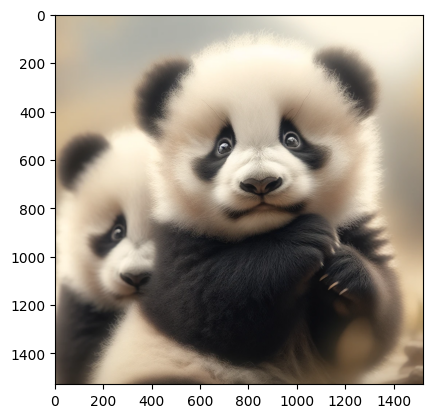

In [105]:
plt.imshow(converted_img)

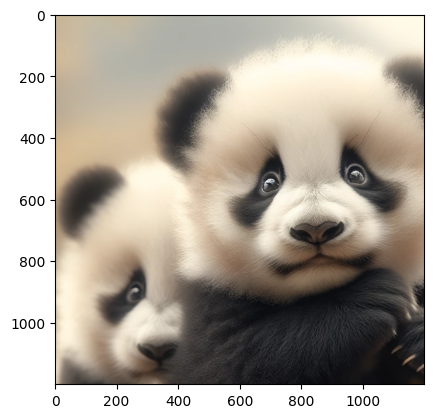

In [106]:
## Cutting the image
cut_img = converted_img[0:1200, 0:1200]
plt.imshow(cut_img)

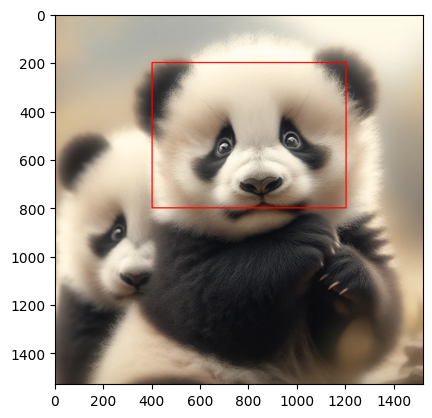

In [107]:
##Changing the color of a specific region using indexing
### ROI --Region of interest
roi = cv2.rectangle(converted_img, (400, 200), (1200, 800), (255, 0, 0), 3)
plt.imshow(roi)

In [108]:
# Defining the rectangle coordinates
x1, y1 = (400,200)
x2, y2 = (1200, 800)

# Accessing pixel coordiante and changing the color
roi[y1:y2, x1:x2] = (0, 255, 0)

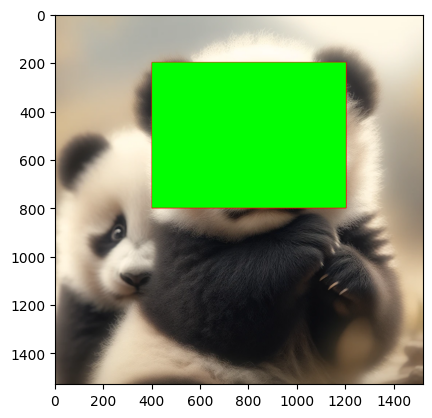

In [109]:
plt.imshow(roi)

# **Q8 -Image Rotation:**

In [110]:
## rotating the image
rows, cols, _ = converted_img.shape
print("Rows:", rows)
print("Cols:", cols)

Rows: 1528
Cols: 1522


In [111]:
print(type(rows/2))
print(type(cols/2))

center = (cols/2, rows/2)

<class 'float'>
<class 'float'>


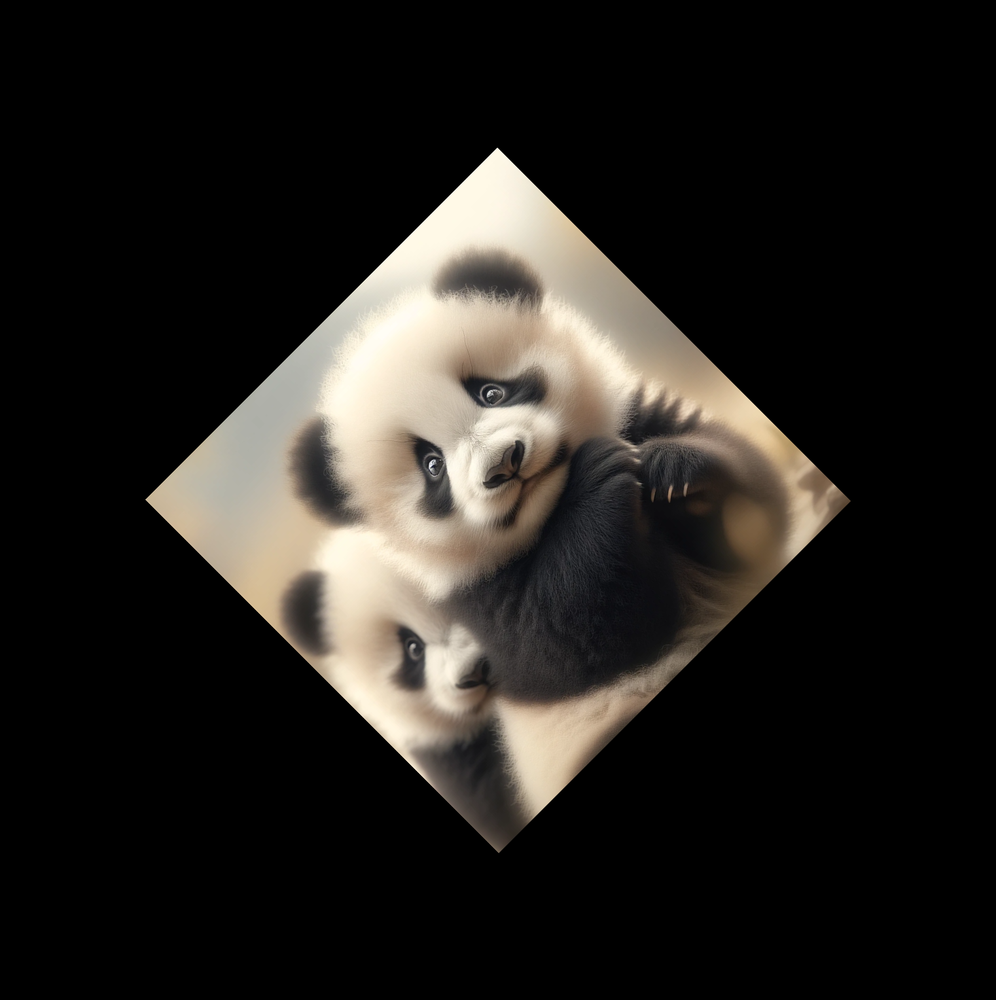

In [112]:
rotation_matrix = cv2.getRotationMatrix2D(center,45, 0.5)
rotated_img = cv2.warpAffine(img, rotation_matrix,(cols, rows))
cv2_imshow(rotated_img)

one issue was the phote been to big, so some of its coners weren't showing do I had to reduce the scaling numbers

# **Q9: Image Flipping:**

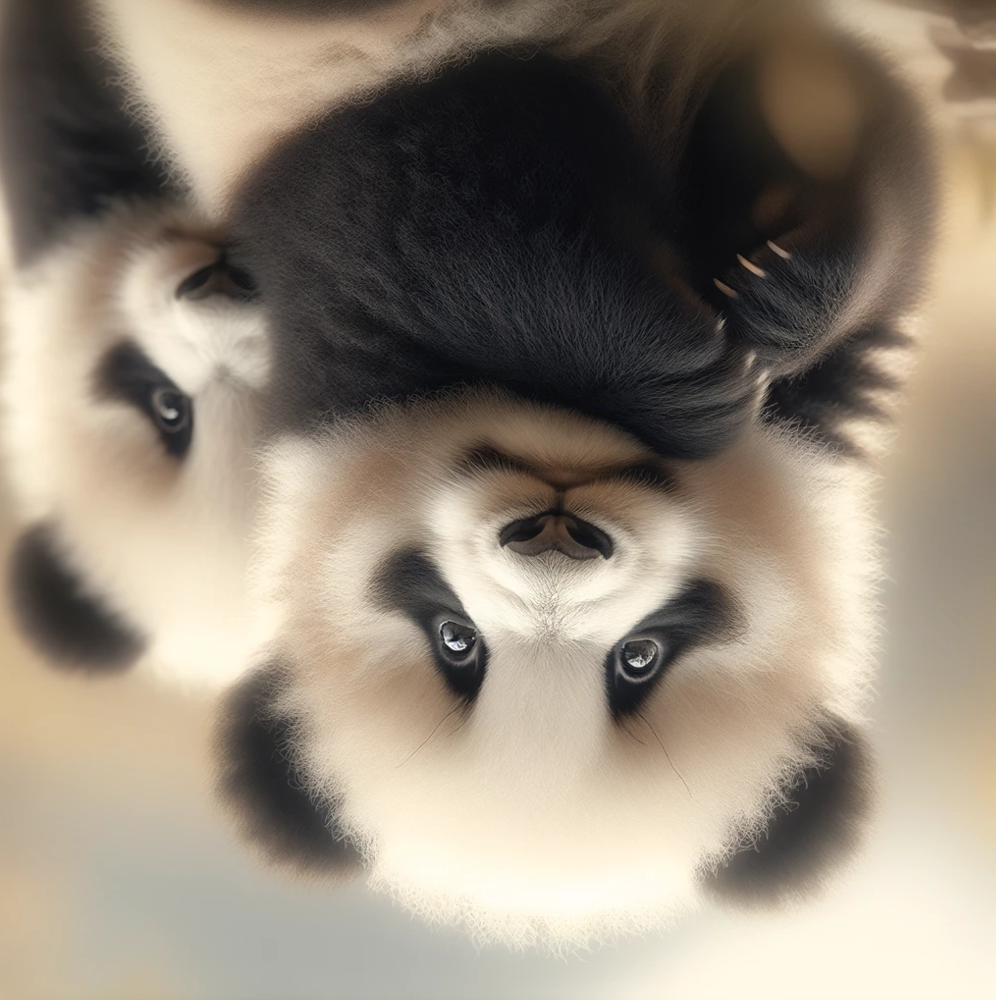

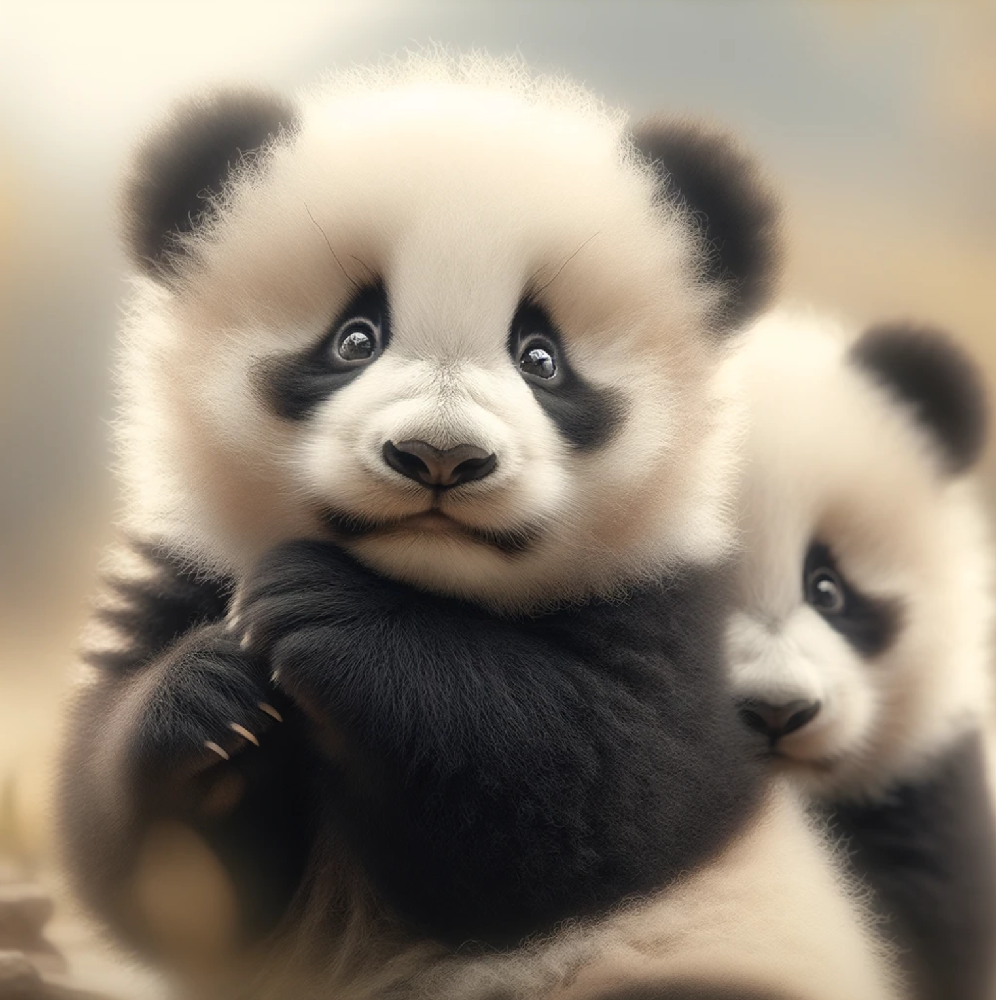

In [113]:
# Flipping the image vertically
f_img_vertical = cv2.flip(img, 0)
cv2_imshow(f_img_vertical)

# Flipping the image horizontally
f_img_horizontal = cv2.flip(img, 1)
cv2_imshow(f_img_horizontal)

it usefull when you need to enhance the quality and diversity of your dataset, improve model performance, and help mitigate biases in machine learning tasks.

# **Q10-Edge Detection:**

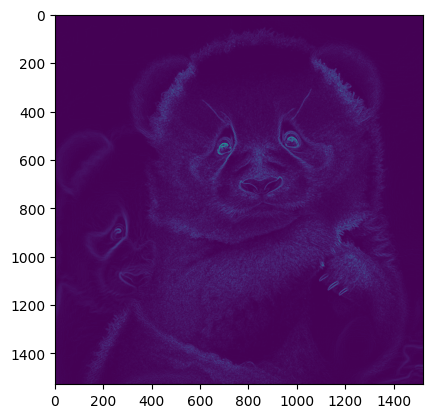

In [114]:
### Using Sobel
gray_img =  cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
sobel_x = cv2.Sobel(gray_img, cv2.CV_64F, 1, 0, ksize=3)
sobel_y = cv2.Sobel(gray_img, cv2.CV_64F, 0, 1, ksize=3)

# Compute the gradient magnitude
gradient_magnitude = cv2.magnitude(sobel_x, sobel_y)

plt.imshow(gradient_magnitude)

The Sobel filter computes the gradient magnitude and direction at each pixel using the convolution results from the Sobel-x and Sobel-y kernels. The magnitude of the gradient represents the strength of the edge, and the direction represents the orientation of the edge.

## **Q11-Gradients in Image:**

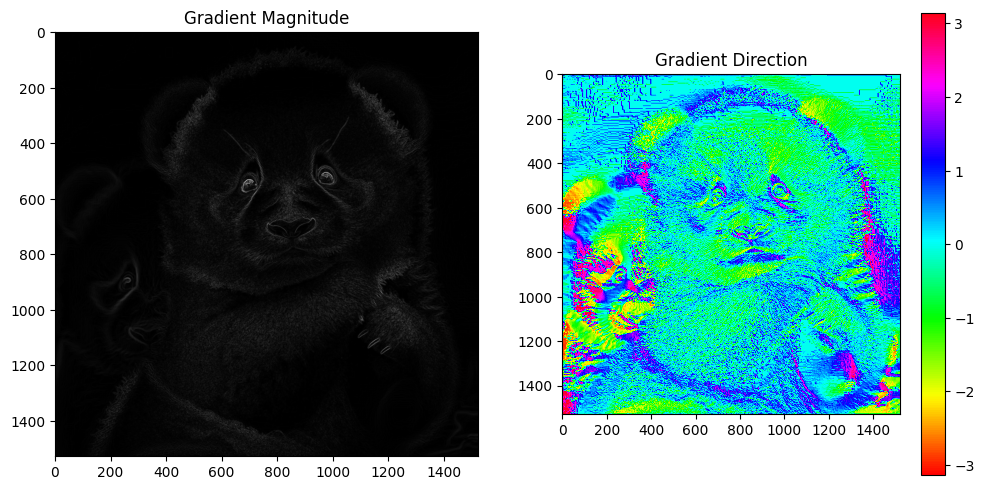

In [116]:
## Calculating the gradient direction and magnitude image

# Calculate gradients using Sobel operators
sobel_x = cv2.Sobel(gray_img, cv2.CV_64F, 1, 0, ksize=3)
sobel_y = cv2.Sobel(gray_img, cv2.CV_64F, 0, 1, ksize=3)

# Compute magnitude and direction of gradients
gradient_magnitude = np.sqrt(sobel_x**2 + sobel_y**2)
gradient_direction = np.arctan2(sobel_y, sobel_x)

# Display gradient magnitude and direction images
plt.figure(figsize=(12, 6))
plt.subplot(1, 2, 1), plt.imshow(gradient_magnitude, cmap='gray'), plt.title('Gradient Magnitude')
plt.subplot(1, 2, 2), plt.imshow(gradient_direction, cmap='hsv'), plt.title('Gradient Direction')
plt.colorbar()
plt.show()